This notebook: 
1. loads disp rate maps and residual stds (rmse) for one time period, plots them. 
2. loads avg coh, coh std, amp dispersion, and avg amp files.
3. plot velocity maps masked by threshold values
4. optional: interpolates the masked vel. maps from just "good" or just "bad" data. 
5. calculates and plots skewness and std over a moving window over velocity map.
6. calculates and plots the Guassian-filtered, masked velocity map. 

This notebook was copied and edited on 5-10-23, 6-21-23.

***

In [1]:
# import stuff
import os,sys
import glob
import pandas
from osgeo import gdal
import datetime 
from datetime import datetime
from datetime import timedelta
from dateutil import parser
import numpy as np
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
%matplotlib  widget 

Use filt? Or unfilt?

In [2]:
# choose 'filt' or 'unfilt'
key1 = 'unfilt'
# choose one: 'avg_val' or 'ref_box' or 'ref_pix'
key2 = 'ref_pix'

Load dates of SLCs/igrams and set directories.

In [3]:
# this one is to pick out the dates 
datesDir = '/data/ocp4/LagunaSalada/Data_and_Figs/cropped_9000_1800_18000_3600/'
# shape of unwrapped igrams
dx = 3000
dy = 750

# larger cropped area with western mountains 
dx = 4000
dy = 1100

# load in dates, make sure they are in order
dates = [os.path.basename(x) for x in glob.glob(datesDir+"SLC_vh/2*")]; dates = sorted(dates)
nd = len(dates); numIgrams = nd-1
# set the driver first, only do once.
#driver=gdal.GetDriverByName('ISCE')

Define the intervals.

In [4]:
start_indices = [0,47,108,147,0,0,107]
end_indices = [46,107,146,numIgrams,88,numIgrams,153]
num_intervals = len(end_indices)
# the last one I just added (4-12-23) as a totally dry period

for i in range(num_intervals):
    print('interval '+str(i)+': '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
print(str(num_intervals)+' intervals.')

interval 0: 20170510-20181125
interval 1: 20181207-20200412
interval 2: 20200418-20201208
interval 3: 20201214-20220108
interval 4: 20170510-20191220
interval 5: 20170510-20220108
interval 6: 20200412-20210119
7 intervals.


Choose which interval to plot for all the following plots. 

In [5]:
j = 0; i = j

Read in disp rate maps and residual std maps.

In [6]:
# read in disp rate file + rmse file
fileName = 'interval_'+str(j)+'_'+key1+'_weighted_ref_to_'+key2+'.r4'
errorFileName = 'interval_'+str(j)+'_'+key1+'_weighted_ref_to_'+key2+'_residual_std.r4'
saveDir = '/data/ocp4/LagunaSalada/Data_and_Figs/12_rate_inversions/disp_rate_maps_with_western_mtns/'
disp_rates = np.ndarray((dy,dx),dtype='float') 
disp_rates_errors = np.ndarray((dy,dx),dtype='float') 
f1 = gdal.Open(saveDir+fileName, gdal.GA_ReadOnly)
disp_rates = f1.ReadAsArray()
f1 = None
f1 = gdal.Open(saveDir+errorFileName, gdal.GA_ReadOnly)
disp_rates_errors = f1.ReadAsArray()
f1 = None
print('interval '+str(j)+' disp rate map + errors loaded.')

interval 0 disp rate map + errors loaded.


Plot the disp rate map and the map of errors.

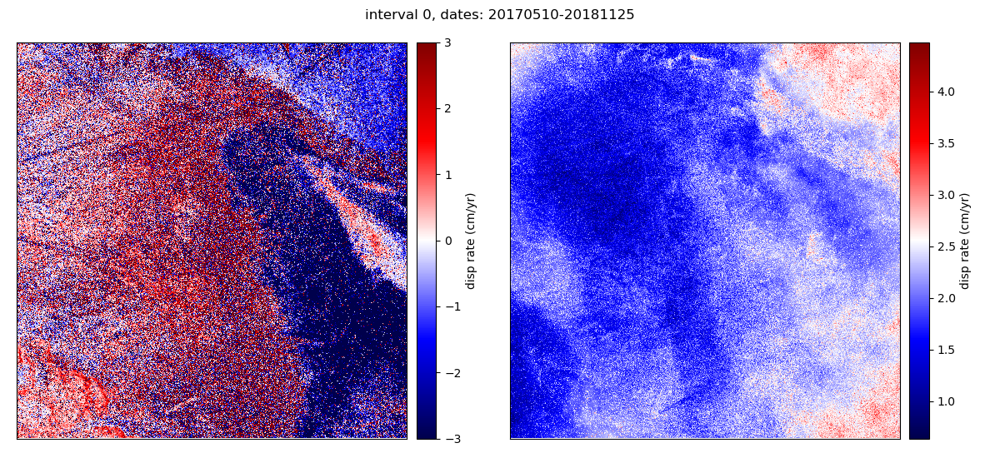

In [7]:
i = j # for 0-3 I used vmin=-5.0,vmax=5.0, but for 4-5 I used vmin=-3.0, vmax=3.0
#print('interval '+str(i)+', dates: '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
plt.figure(figsize=(12,5.5),tight_layout=True)
plt.subplot(1,2,1)
plt.imshow(disp_rates, aspect='auto', vmin=-3.0,vmax=3.0,\
            interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap('seismic')
plt.xlim([dx,0]); plt.ylim([dy,0])
plt.xticks([]); plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(disp_rates_errors, aspect='auto',\
            interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap('seismic')
plt.xlim([dx,0]); plt.ylim([dy,0])
plt.xticks([]); plt.yticks([])
plt.suptitle('interval '+str(i)+', dates: '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
plt.show()

Now load files:
1. avg coherence
2. std of coherence
3. amp dispersion
4. avg amp
5. unwrap errors

In [8]:
loadDir = '/data/ocp4/LagunaSalada/Data_and_Figs/cropped_9000_1800_18000_3600/cropped_LS_with_western_mtns/'

file_name = 'coh_avg.r4' 
f1 = gdal.Open(loadDir+file_name, gdal.GA_ReadOnly)
coh_avg = f1.ReadAsArray(); f1 = None
print('Avg coh values map loaded.')

file_name = 'coh_std.r4' 
f1 = gdal.Open(loadDir+file_name, gdal.GA_ReadOnly)
coh_std = f1.ReadAsArray(); f1 = None
print('Std of coh map loaded.')

file_name = 'amp_dispersion.r4' 
f1 = gdal.Open(loadDir+file_name, gdal.GA_ReadOnly)
amp_dispersion = f1.ReadAsArray(); f1 = None
print('Amplitude dispersion for each pixel loaded.')

file_name = 'avg_amp.r4' 
f1 = gdal.Open(loadDir+file_name, gdal.GA_ReadOnly)
avg_amp = f1.ReadAsArray(); f1 = None
print('Average amp for each pixel loaded.')

file_name = 'unfilt_unwrapped/wrap_err.i1' 
f1 = gdal.Open(loadDir+file_name, gdal.GA_ReadOnly)
wrap_err = f1.ReadAsArray(); f1 = None
print('wrap errors for each pixel loaded.')

Avg coh values map loaded.
Std of coh map loaded.
Amplitude dispersion for each pixel loaded.
Average amp for each pixel loaded.
wrap errors for each pixel loaded.


Make a colormap where Nans are different color: try green.

In [9]:
seismic2 = plt.cm.get_cmap("seismic").copy()
seismic2.set_bad(color='green')
print('colormap made where NANs will be green.')

colormap made where NANs will be green.


Set threshold values here and do the masking accordingly.

In [10]:
# how many criteria? 
num_th = 5

coh_th= 0.8         # avg coh 
rmse_th= 2          # rmse 
amp_disp_th= 0.35   # amp dispersion
amp_th= 45          # avg amp 
wrap_err_th = 8    # wrap error

# Now do the masking with threshold values above.
disp_rates_coh = np.ma.masked_where(coh_avg<coh_th,disp_rates)
disp_rates_coh_bad = np.ma.masked_where(coh_avg>coh_th,disp_rates)
disp_rates_rmse = np.ma.masked_where(disp_rates_errors>rmse_th,disp_rates)
disp_rates_rmse_bad = np.ma.masked_where(disp_rates_errors<rmse_th,disp_rates)
disp_rates_amp_disp = np.ma.masked_where(amp_dispersion>amp_disp_th,disp_rates)
disp_rates_amp_disp_bad = np.ma.masked_where(amp_dispersion<amp_disp_th,disp_rates)
disp_rates_avg_amp = np.ma.masked_where(avg_amp>amp_th,disp_rates)
disp_rates_avg_amp_bad = np.ma.masked_where(avg_amp<amp_th,disp_rates)
disp_rates_wrap_err = np.ma.masked_where(wrap_err>wrap_err_th,disp_rates)
disp_rates_wrap_err_bad = np.ma.masked_where(wrap_err<wrap_err_th,disp_rates)

Plot the masked versions of the velocity map.

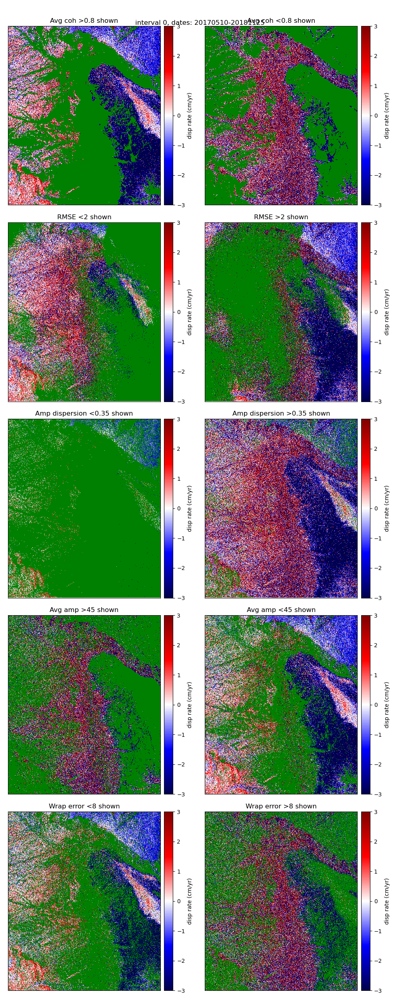

In [11]:
plt.figure(figsize=(10,num_th*5),tight_layout=True)
plt.subplot(num_th,2,1)
plt.imshow(disp_rates_coh, aspect='auto', vmin=-3.0,vmax=3.0,interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap(seismic2)
plt.xlim([dx,0]); plt.ylim([dy,0]); plt.xticks([]); plt.yticks([])
plt.title('Avg coh >'+str(coh_th)+' shown')
plt.subplot(num_th,2,2)
plt.imshow(disp_rates_coh_bad, aspect='auto', vmin=-3.0,vmax=3.0,interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap(seismic2)
plt.xlim([dx,0]); plt.ylim([dy,0]); plt.xticks([]); plt.yticks([])
plt.title('Avg coh <'+str(coh_th)+' shown')
plt.subplot(num_th,2,3)
plt.imshow(disp_rates_rmse, aspect='auto',vmin=-3.0,vmax=3.0,interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap(seismic2)
plt.xlim([dx,0]); plt.ylim([dy,0]); plt.xticks([]); plt.yticks([])
plt.title('RMSE <'+str(rmse_th)+' shown')
plt.subplot(num_th,2,4)
plt.imshow(disp_rates_rmse_bad, aspect='auto',vmin=-3.0,vmax=3.0,interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap(seismic2)
plt.xlim([dx,0]); plt.ylim([dy,0]); plt.xticks([]); plt.yticks([])
plt.title('RMSE >'+str(rmse_th)+' shown')
plt.subplot(num_th,2,5)
plt.imshow(disp_rates_amp_disp, aspect='auto',vmin=-3.0,vmax=3.0,interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap(seismic2) # seismic good too 
plt.xlim([dx,0]); plt.ylim([dy,0]); plt.xticks([]); plt.yticks([])
plt.title('Amp dispersion <'+str(amp_disp_th)+' shown')
plt.subplot(num_th,2,6)
plt.imshow(disp_rates_amp_disp_bad, aspect='auto',vmin=-3.0,vmax=3.0,interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap(seismic2) # seismic usually 
plt.xlim([dx,0]); plt.ylim([dy,0]); plt.xticks([]); plt.yticks([])
plt.title('Amp dispersion >'+str(amp_disp_th)+' shown')
plt.subplot(num_th,2,7)
plt.imshow(disp_rates_avg_amp, aspect='auto',vmin=-3.0,vmax=3.0,interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap(seismic2)
plt.xlim([dx,0]); plt.ylim([dy,0]); plt.xticks([]); plt.yticks([])
plt.title('Avg amp >'+str(amp_th)+' shown')
plt.subplot(num_th,2,8)
plt.imshow(disp_rates_avg_amp_bad, aspect='auto',vmin=-3.0,vmax=3.0,interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap(seismic2)
plt.xlim([dx,0]); plt.ylim([dy,0]); plt.xticks([]); plt.yticks([])
plt.title('Avg amp <'+str(amp_th)+' shown')
plt.subplot(num_th,2,9)
plt.imshow(disp_rates_wrap_err, aspect='auto',vmin=-3.0,vmax=3.0,interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap(seismic2)
plt.xlim([dx,0]); plt.ylim([dy,0]); plt.xticks([]); plt.yticks([])
plt.title('Wrap error <'+str(wrap_err_th)+' shown')
plt.subplot(num_th,2,10)
plt.imshow(disp_rates_wrap_err_bad, aspect='auto',vmin=-3.0,vmax=3.0,interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap(seismic2)
plt.xlim([dx,0]); plt.ylim([dy,0]); plt.xticks([]); plt.yticks([])
plt.title('Wrap error >'+str(wrap_err_th)+' shown')

plt.suptitle('interval '+str(i)+', dates: '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
plt.show()

Try interpolating them for better display. Try linear and nearest. Takes ~3? minutes to run.

In [12]:
%%script echo skipping
from scipy.interpolate import NearestNDInterpolator, LinearNDInterpolator

# ----------GOOD PIX: low amplitude dispersion. ----------
# set up array with nans and data so I can interpolate it for visualization.
disp_rates_to_interp = np.empty((dy,dx))*np.nan       # initialize temp ramp with nans
mask_y,mask_x = np.nonzero(disp_rates_masked3)          # pull out indices of nonNan values 
disp_rates_to_interp[mask_y,mask_x] = disp_rates_masked3[mask_y,mask_x]   # put those in new array, left with nans where masked 
mask = np.where(~np.isnan(disp_rates_to_interp))          # now infill the nans with nearest interpolation
# NEAREST, https://stackoverflow.com/questions/68197762/fill-nan-with-nearest-neighbor-in-numpy-array
interp = NearestNDInterpolator(np.transpose(mask),disp_rates_to_interp[mask])
disp_rates_near_interp = interp(*np.indices(disp_rates_to_interp.shape))
#LINEAR
interp2 = LinearNDInterpolator(np.transpose(mask),disp_rates_to_interp[mask])
disp_rates_linear_interp = interp2(*np.indices(disp_rates_to_interp.shape))

# ----------BAD PIX: high amplitude dispersion. ----------
# set up array with nans and data so I can interpolate it for visualization.
disp_rates_to_interp_bad = np.empty((dy,dx))*np.nan       # initialize temp ramp with nans
mask_y,mask_x = np.nonzero(disp_rates_masked4)          # pull out indices of nonNan values 
disp_rates_to_interp_bad[mask_y,mask_x] = disp_rates_masked4[mask_y,mask_x]   # put those in new array, left with nans where masked 
mask2 = np.where(~np.isnan(disp_rates_to_interp_bad))          # now infill the nans with nearest interpolation
# NEAREST, https://stackoverflow.com/questions/68197762/fill-nan-with-nearest-neighbor-in-numpy-array
interp = NearestNDInterpolator(np.transpose(mask2),disp_rates_to_interp_bad[mask2])
disp_rates_near_interp_bad = interp(*np.indices(disp_rates_to_interp_bad.shape))
#LINEAR
interp2 = LinearNDInterpolator(np.transpose(mask2),disp_rates_to_interp_bad[mask2])
disp_rates_linear_interp_bad = interp2(*np.indices(disp_rates_to_interp.shape))

skipping


In [13]:
%%script echo skipping
# plot both interp methods. For both low+high amp dispersion pixels. 
plt.figure(figsize=(10,10),tight_layout=True)
plt.subplot(2,2,1)
plt.imshow(disp_rates_near_interp, cmap='seismic',aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Good pix (low amp dispersion) \nnearest interpolated') 
plt.colorbar(label='disp rate (cm/yr)'); 
plt.subplot(2,2,2)
plt.imshow(disp_rates_linear_interp, cmap='seismic',aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Good pix (low amp dispersion) \nlinearly interpolated') 
plt.colorbar(label='disp rate (cm/yr)'); 
plt.subplot(2,2,3)
plt.imshow(disp_rates_near_interp_bad, cmap='seismic',aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Bad pix (high amp dispersion) \nnearest interpolated') 
plt.colorbar(label='disp rate (cm/yr)'); 
plt.subplot(2,2,4)
plt.imshow(disp_rates_linear_interp_bad, cmap='seismic',aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Bad pix (high amp dispersion) \nlinearly interpolated') 
plt.colorbar(label='disp rate (cm/yr)'); 
plt.show()

skipping


Interpolate these for better visualization. Takes ~3 min.

In [14]:
%%script echo skipping
# ----------GOOD PIX: high average amplitude. ----------
# set up array with nans and data so I can interpolate it for visualization.
disp_rates_to_interp = np.empty((dy,dx))*np.nan       # initialize temp ramp with nans
mask_y,mask_x = np.nonzero(disp_rates_masked6)          # pull out indices of nonNan values 
disp_rates_to_interp[mask_y,mask_x] = disp_rates_masked6[mask_y,mask_x]   # put those in new array, left with nans where masked 
mask = np.where(~np.isnan(disp_rates_to_interp))          # now infill the nans with nearest interpolation
# NEAREST, https://stackoverflow.com/questions/68197762/fill-nan-with-nearest-neighbor-in-numpy-array
interp = NearestNDInterpolator(np.transpose(mask),disp_rates_to_interp[mask])
disp_rates_near_interp_2 = interp(*np.indices(disp_rates_to_interp.shape))
#LINEAR
interp2 = LinearNDInterpolator(np.transpose(mask),disp_rates_to_interp[mask])
disp_rates_linear_interp_2 = interp2(*np.indices(disp_rates_to_interp.shape))

# ----------BAD PIX: low average amplitude. ----------
# set up array with nans and data so I can interpolate it for visualization.
disp_rates_to_interp_bad = np.empty((dy,dx))*np.nan       # initialize temp ramp with nans
mask_y,mask_x = np.nonzero(disp_rates_masked5)          # pull out indices of nonNan values 
disp_rates_to_interp_bad[mask_y,mask_x] = disp_rates_masked5[mask_y,mask_x]   # put those in new array, left with nans where masked 
mask2 = np.where(~np.isnan(disp_rates_to_interp_bad))          # now infill the nans with nearest interpolation
# NEAREST, https://stackoverflow.com/questions/68197762/fill-nan-with-nearest-neighbor-in-numpy-array
interp = NearestNDInterpolator(np.transpose(mask2),disp_rates_to_interp_bad[mask2])
disp_rates_near_interp_bad_2 = interp(*np.indices(disp_rates_to_interp_bad.shape))
#LINEAR
interp2 = LinearNDInterpolator(np.transpose(mask2),disp_rates_to_interp_bad[mask2])
disp_rates_linear_interp_bad_2 = interp2(*np.indices(disp_rates_to_interp.shape))

skipping


In [15]:
%%script echo skipping
# plot both interp methods. For both low+high amp dispersion pixels. 
plt.figure(figsize=(10,10),tight_layout=True)
plt.subplot(2,2,1)
plt.imshow(disp_rates_near_interp_2, cmap='seismic',aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Good pix (high avg amp) \nnearest interpolated') 
plt.colorbar(label='disp rate (cm/yr)'); 
plt.subplot(2,2,2)
plt.imshow(disp_rates_linear_interp_2, cmap='seismic',aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Good pix (high avg amp) \nlinearly interpolated') 
plt.colorbar(label='disp rate (cm/yr)'); 
plt.subplot(2,2,3)
plt.imshow(disp_rates_near_interp_bad_2, cmap='seismic',aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Bad pix (low avg amp) \nnearest interpolated') 
plt.colorbar(label='disp rate (cm/yr)'); 
plt.subplot(2,2,4)
plt.imshow(disp_rates_linear_interp_bad_2, cmap='seismic',aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Bad pix (low avg amp) \nlinearly interpolated') 
plt.colorbar(label='disp rate (cm/yr)'); 
plt.show()

skipping


Calculate skewness values for every pixel (except edge pixels) over a moving alooks x rlooks window. 
<br> This takes >15 minutes.

In [16]:
%%script echo skipping
from scipy.stats import skew
alooks = 50      # y-direction, start with 4
rlooks = 50     # x-direction, start with 20
skews = np.zeros((dy,dx))
stds = np.zeros((dy,dx))
for y in range(dy):       # dy for all pixels 
    for x in range(dx):   # dx for all pixels 
        if y-alooks/2 < 0 or y+alooks/2 >= dy or x-rlooks/2 < 0 or x+rlooks/2 >= dx:
            skews[y,x] = float('nan')
            stds[y,x] = float('nan')
            #print('('+str(y)+','+str(x)+') nan')
        else: 
            #skew_vals[y,x] = skew(unwr_full_res[k,y-int(alooks/2):y+int(alooks/2),x-int(rlooks/2):x+int(rlooks/2)])
            skews[y,x] = skew((disp_rates[y-int(alooks/2):y+int(alooks/2),x-int(rlooks/2):x+int(rlooks/2)]).flatten())
            stds[y,x] = np.std((disp_rates[y-int(alooks/2):y+int(alooks/2),x-int(rlooks/2):x+int(rlooks/2)]).flatten())
            #print('('+str(y)+','+str(x)+') skew')
print('skew + std. dev. values calculated for all pixels of this velocity map.')

skipping


In [17]:
%%script echo skipping
plt.figure(figsize=(12,5.5),tight_layout=True) 
plt.subplot(1,2,1)
plt.imshow(skews,aspect='auto',interpolation='nearest',extent=[0,dx,dy,0],vmin=-1,vmax=1)
plt.colorbar(orientation='vertical',pad=0.03,label='skewness'); plt.set_cmap('jet')
plt.title('skews')
plt.xlim([dx,0]); plt.ylim([dy,0])
#plt.xticks([]); plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(stds,aspect='auto',interpolation='nearest',extent=[0,dx,dy,0],vmin=0,vmax=12)
plt.colorbar(orientation='vertical',pad=0.03,label='std dev'); plt.set_cmap('jet')
plt.xlim([dx,0]); plt.ylim([dy,0])
plt.title('standard deviations')
plt.suptitle('interval '+str(i)+', dates: '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
plt.show()

skipping


Show that this method works. Test case is low amplitude dispersion pixels.

/tmp/ipykernel_35271/2227034151.py:41: RuntimeWarning: invalid value encountered in true_divide
  ab = vels_filt / amp_disp_mask_filt


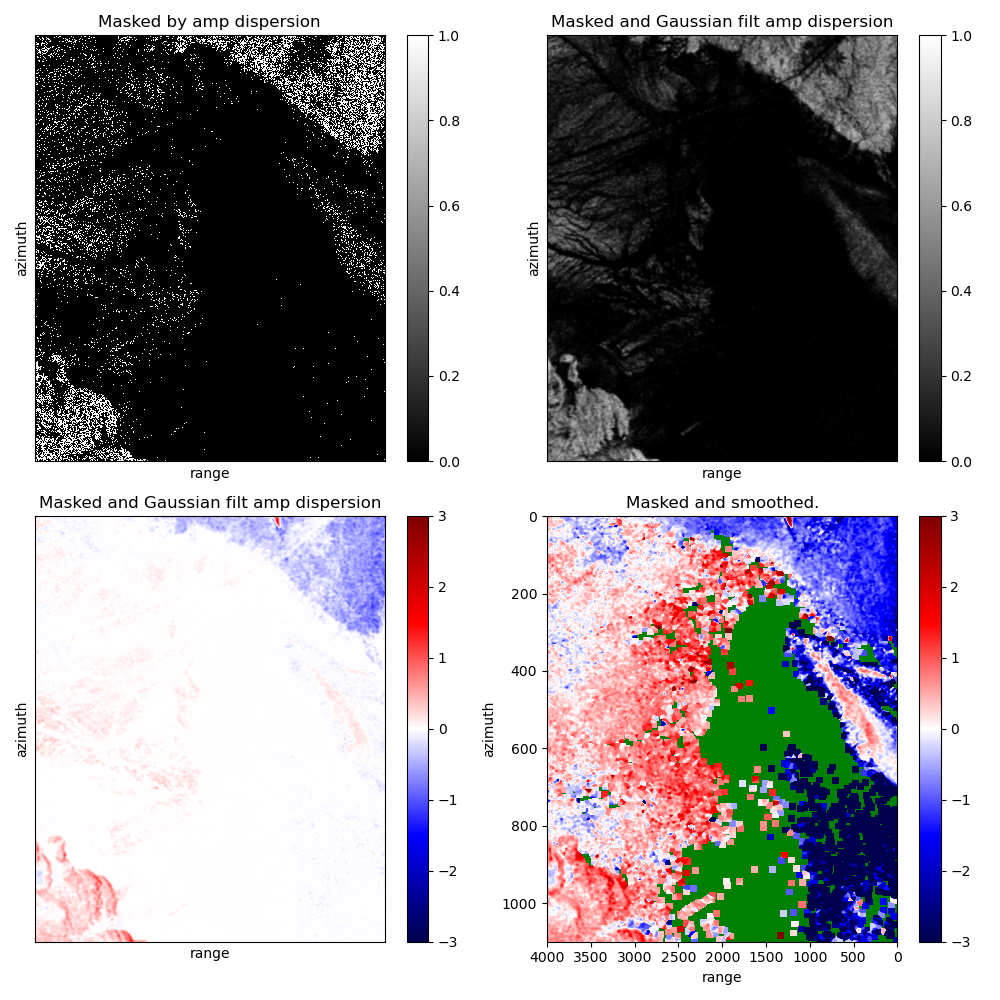

In [18]:
# start with low amp dispersion (good pixels) mask.
# amplitude dispersion- good pix 
amp_disp_mask_y,amp_disp_mask_x = np.nonzero(disp_rates_amp_disp)
amp_disp_mask = np.zeros((dy,dx))
amp_disp_mask[amp_disp_mask_y,amp_disp_mask_x] = 1.0

# Gaussian filter.
alooks=4        # y 
rlooks=20       # x
amp_disp_mask_filt = gaussian_filter(amp_disp_mask,sigma = [alooks/2,rlooks/2])

# plot it 
plt.figure(figsize=(10,10),tight_layout=True)
plt.subplot(2,2,1)
plt.imshow(amp_disp_mask, cmap='gray',aspect='auto',interpolation='nearest',vmin=0,vmax=1.0); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Masked by amp dispersion') 
plt.colorbar()

# wherever this masked, filt map is zero is where we want to put Nans.
Nans_y,Nans_x = np.where(amp_disp_mask_filt == 0)

plt.subplot(2,2,2)
plt.imshow(amp_disp_mask_filt, cmap='gray',aspect='auto',interpolation='nearest',vmin=0,vmax=1.0); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Masked and Gaussian filt amp dispersion') 
plt.colorbar()

# initialize igram_masked by starting with zeros, then replace good pix with their phase value
vels_masked = np.zeros((dy,dx))
vels_masked[amp_disp_mask_y,amp_disp_mask_x] = disp_rates[amp_disp_mask_y,amp_disp_mask_x]
# filter it
vels_filt = gaussian_filter(vels_masked,sigma = [alooks/2,rlooks/2])

plt.subplot(2,2,3)
plt.imshow(vels_filt, cmap=seismic2, aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Masked and Gaussian filt amp dispersion') 
plt.colorbar()

ab = vels_filt / amp_disp_mask_filt
# put original velocity values in 
#ab[amp_disp_mask_y,amp_disp_mask_x] = disp_rates[amp_disp_mask_y,amp_disp_mask_x]
# put Nans where there is no data
ab[Nans_y,Nans_x] = np.nan

plt.subplot(2,2,4)
plt.imshow(ab, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); #plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('Masked and smoothed.') 
plt.colorbar(); plt.show()

Now define a function to do all the steps.

In [19]:
def mask_smooth(masked_array,disp_rates,dy,dx):
    mask_y,mask_x = np.nonzero(masked_array)    # find pix where values haven't been masked
    mask = np.zeros((dy,dx))                    # initialize an array of zeros that's the same size as input for the mask
    mask[mask_y,mask_x] = 1.0                   # put 1's in the spots that had real values 
    alooks = 4                                  # amount to filter in the azimuth/y direction
    rlooks = 20                                 # amount to filter in the range/x direction
    mask_filt = gaussian_filter(mask,sigma=[alooks/2,rlooks/2])     # filter the mask to smear it out
    Nans_y,Nans_x = np.where(mask_filt==0)      # find where the filtered mask didn't reach (which pix are still 0)
    vels_masked = np.zeros((dy,dx))             # initialize array of zeros that's the same size as input for the velocities
    vels_masked[mask_y,mask_x] = disp_rates[mask_y,mask_x]      # put in the "good" disp rates into the masked vels array.
    vels_filt = gaussian_filter(vels_masked,sigma=[alooks/2,rlooks/2])  # filter the vels_masked 
    ab = vels_filt / mask_filt                  # divide the two
    #ab[mask_y,mask_x] = disp_rates[mask_y,mask_x]   # put back in the good values. OPTIONAL
    ab[Nans_y,Nans_x] = np.nan
    return ab

For each mask: 
1. good (low) RMSE 
2. bad (high) RMSE
3. good average temporal coherence
4. bad average temporal coherence
5. good pixels, low amplitude dispersion
6. bad pixels, high amplitude dispersion
7. good pixels, high average amplitude 
8. bad pixels, low average amplitude

In [20]:
# run the function for all the masked maps
ab_rmse = mask_smooth(disp_rates_rmse,disp_rates,dy,dx)
ab_rmse_bad = mask_smooth(disp_rates_rmse_bad,disp_rates,dy,dx)
ab_coh = mask_smooth(disp_rates_coh,disp_rates,dy,dx)
ab_coh_bad = mask_smooth(disp_rates_coh_bad,disp_rates,dy,dx)
ab_amp_disp = mask_smooth(disp_rates_amp_disp,disp_rates,dy,dx)
ab_amp_disp_bad = mask_smooth(disp_rates_amp_disp_bad,disp_rates,dy,dx)
ab_avg_amp = mask_smooth(disp_rates_avg_amp,disp_rates,dy,dx)
ab_avg_amp_bad = mask_smooth(disp_rates_avg_amp_bad,disp_rates,dy,dx)
ab_wrap_err = mask_smooth(disp_rates_wrap_err,disp_rates,dy,dx)
ab_wrap_err_bad = mask_smooth(disp_rates_wrap_err_bad,disp_rates,dy,dx)

/tmp/ipykernel_35271/1241683323.py:12: RuntimeWarning: invalid value encountered in true_divide
  ab = vels_filt / mask_filt                  # divide the two


Now plot them all together.

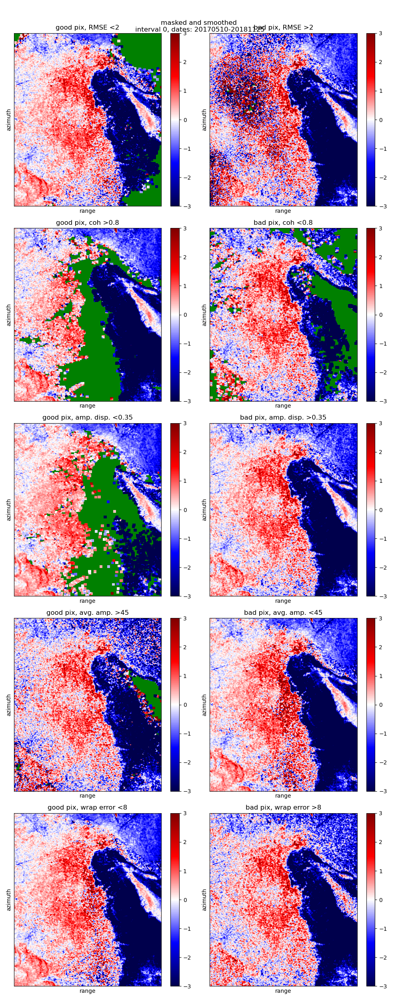

In [21]:
plt.figure(figsize=(10,num_th*5),tight_layout=True)
plt.subplot(num_th,2,1)
plt.imshow(ab_rmse, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([]); plt.xlabel('range'); plt.ylabel('azimuth'); 
plt.title('good pix, RMSE <'+str(rmse_th)); plt.colorbar()
plt.subplot(num_th,2,2)
plt.imshow(ab_rmse_bad, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([]); plt.xlabel('range'); plt.ylabel('azimuth'); 
plt.title('bad pix, RMSE >'+str(rmse_th)); plt.colorbar()
plt.subplot(num_th,2,3)
plt.imshow(ab_coh, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([]); plt.xlabel('range'); plt.ylabel('azimuth'); 
plt.title('good pix, coh >'+str(coh_th)); plt.colorbar()
plt.subplot(num_th,2,4)
plt.imshow(ab_coh_bad, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([]); plt.xlabel('range'); plt.ylabel('azimuth'); 
plt.title('bad pix, coh <'+str(coh_th)); plt.colorbar()
plt.subplot(num_th,2,5)
plt.imshow(ab_amp_disp, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([]); plt.xlabel('range'); plt.ylabel('azimuth'); 
plt.title('good pix, amp. disp. <'+str(amp_disp_th)); plt.colorbar()
plt.subplot(num_th,2,6)
plt.imshow(ab_amp_disp_bad, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([]); plt.xlabel('range'); plt.ylabel('azimuth'); 
plt.title('bad pix, amp. disp. >'+str(amp_disp_th)); plt.colorbar()
plt.subplot(num_th,2,7)
plt.imshow(ab_avg_amp, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([]); plt.xlabel('range'); plt.ylabel('azimuth'); 
plt.title('good pix, avg. amp. >'+str(amp_th)); plt.colorbar()
plt.subplot(num_th,2,8)
plt.imshow(ab_avg_amp_bad, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([]); plt.xlabel('range'); plt.ylabel('azimuth'); 
plt.title('bad pix, avg. amp. <'+str(amp_th)); plt.colorbar()
plt.subplot(num_th,2,9)
plt.imshow(ab_wrap_err, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([]); plt.xlabel('range'); plt.ylabel('azimuth'); 
plt.title('good pix, wrap error <'+str(wrap_err_th)); plt.colorbar()
plt.subplot(num_th,2,10)
plt.imshow(ab_wrap_err_bad, cmap=seismic2,aspect='auto',interpolation='nearest',vmin=-3,vmax=3); 
plt.xlim(dx,0); plt.xticks([]); plt.yticks([]); plt.xlabel('range'); plt.ylabel('azimuth'); 
plt.title('bad pix, wrap error >'+str(wrap_err_th))
plt.suptitle('masked and smoothed \ninterval '+str(i)+', ''dates: '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]])) 
plt.colorbar(); plt.show()

Compare these rates to the filtered inversion rates. 

In [22]:
%%script echo skipping
# read in full res disp rate files
# loadDir = '/data/ocp4/LagunaSalada/Data_and_Figs/11_unwrapped_igrams/disp_rate_maps_for_intervals/'
loadDir = '/data/ocp4/LagunaSalada/Data_and_Figs/12_rate_inversions/disp_rate_maps_with_western_mtns/'

fileName = 'interval_'+str(j)+'_'+key1+'_weighted_ref_to_'+key2+'.r4'
errorFileName = 'interval_'+str(j)+'_'+key1+'_weighted_ref_to_'+key2+'_residual_std.r4'

saveDir = '/data/ocp4/LagunaSalada/Data_and_Figs/12_rate_inversions/disp_rate_maps_with_western_mtns/'
disp_rates = np.ndarray((dy,dx),dtype='float') 
disp_rates_errors = np.ndarray((dy,dx),dtype='float') 

f1 = gdal.Open(saveDir+fileName, gdal.GA_ReadOnly)
disp_rates = f1.ReadAsArray()
f1 = None

f1 = gdal.Open(saveDir+errorFileName, gdal.GA_ReadOnly)
disp_rates_errors = f1.ReadAsArray()
f1 = None

print('interval '+str(j)+' disp rate map + errors loaded.')

i = j # for 0-3 I used vmin=-5.0,vmax=5.0, but for 4-5 I used vmin=-3.0, vmax=3.0
#print('interval '+str(i)+', dates: '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
plt.figure(figsize=(6,5.5),tight_layout=True)
plt.imshow(disp_rates, aspect='auto', vmin=-3.0,vmax=3.0,\
            interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap('seismic')
plt.xlim([dx,0]); plt.ylim([dy,0])
plt.xticks([]); plt.yticks([])
plt.title('dates: '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
plt.show()

plt.figure(figsize=(6,5.5),tight_layout=True)
plt.imshow(disp_rates_errors, aspect='auto',\
            interpolation='nearest')
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap('seismic')
plt.xlim([dx,0]); plt.ylim([dy,0])
plt.xticks([]); plt.yticks([])
plt.title('dates: '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
plt.show()

skipping
